# Visual Module Dataset Testing (CPU-Safe)

This notebook runs **only inference** with your trained visual model artifacts from `outputs/`.

What it does:
- Loads `visual_scorer_best.pth` and related config/stats
- Rebuilds the same train/val/test split from AADB metadata
- Samples a small number of test images
- Shows prediction + score + Grad-CAM regions
- Shows both **main good regions** (predicted class CAM) and **bad regions** (bad-class CAM)

No training and no epochs are executed.

## Color Legend for the Testing Output

The red/black maps are **Grad-CAM heatmaps**, not the original image colors.

- **Black / very dark**: low model attention, so that area contributes little to the prediction.
- **Red**: important region, the model is using this area a lot.
- **Yellow / white**: even stronger attention when the heatmap colormap reaches the top values.

For the panels in this notebook:
- **Main good regions (pred CAM)** = attention map for the predicted class.
- **Main bad regions (bad CAM)** = attention map forced on the `bad` class, so you can compare what the model would focus on if the image looked low quality.
- If the panel looks mostly black with a few red pixels, that usually means the model found only a few strong evidence areas, not that the image is broken.

The overlay panel combines the heatmap with the original image, so the red pixels show where the model is looking on top of the photo.

In [55]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torchvision import transforms
from sklearn.model_selection import train_test_split

from visual_inference import load_visual_model, normalize_attrs
from xai_inference import GradCAM

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
OUTPUT_DIR = './outputs'
SAMPLE_N = 6          # keep small for CPU safety
USE_TTA = False       # keep False for CPU-safe testing
RANDOM_STATE = 42

print(f'Device: {DEVICE}')
print(f'Artifacts dir: {OUTPUT_DIR}')

Device: cpu
Artifacts dir: ./outputs


In [56]:
# Load trained visual model artifacts (no retraining)
artifacts = load_visual_model(OUTPUT_DIR, device=DEVICE)
model = artifacts['model']
attr_cols = artifacts['attr_cols']
norm_stats = artifacts['norm_stats']
class_names = artifacts['class_names']

print('Model loaded from artifacts.')
print('Class names:', class_names)
print('Num attributes:', len(attr_cols))

Model loaded from artifacts.
Class names: ['bad', 'average', 'good']
Num attributes: 11


In [57]:
# Discover AADB dataset path without requiring network access
# Priority: env var -> known local Kaggle cache -> kagglehub fallback

def _find_local_aadb_path():
    candidates = []

    env_path = os.environ.get('AADB_PATH', '').strip()
    if env_path:
        candidates.append(env_path)

    user_profile = os.environ.get('USERPROFILE', '')
    if user_profile:
        candidates.extend([
            os.path.join(user_profile, '.cache', 'kagglehub', 'datasets', 'bogdanpetre98', 'aadb-imagedatabase', 'versions', '6'),
            os.path.join(user_profile, '.cache', 'kagglehub', 'datasets', 'bogdanpetre98', 'aadb-imagedatabase', 'versions', 'latest'),
        ])

    for path in candidates:
        csv_candidate = os.path.join(path, 'Dataset.csv')
        if os.path.exists(csv_candidate):
            return path

    return None


data_path = _find_local_aadb_path()
if data_path is None:
    try:
        import kagglehub
        data_path = kagglehub.dataset_download('bogdanpetre98/aadb-imagedatabase')
        print('AADB path from kagglehub:', data_path)
    except Exception as e:
        raise RuntimeError(
            'Could not find the AADB dataset locally. Set env var AADB_PATH to the dataset folder or download it once and rerun.'
        ) from e

csv_path = os.path.join(data_path, 'Dataset.csv')
img_dir = os.path.join(data_path, 'datasetImages_warp256', 'datasetImages_warp256')

print('AADB dataset path:', data_path)
print('CSV:', csv_path)
print('IMG:', img_dir)

# Load the CSV only after the path is confirmed
# This avoids an internet-dependent failure during notebook testing.
df = pd.read_csv(csv_path)
df['img_path'] = df['ImageFile'].apply(lambda f: os.path.join(img_dir, f))
df = df[df['img_path'].apply(os.path.exists)].copy()

# Rebuild labels exactly as training notebook (quantile-based)
q33 = df['score'].quantile(0.33)
q66 = df['score'].quantile(0.66)

def make_label(s):
    if s < q33:
        return 0
    if s < q66:
        return 1
    return 2

df['label'] = df['score'].apply(make_label)

# Same split logic used in training notebook
train_df, temp_df = train_test_split(
    df, test_size=0.30, random_state=RANDOM_STATE, stratify=df['label']
)
val_df, test_df = train_test_split(
    temp_df, test_size=0.50, random_state=RANDOM_STATE, stratify=temp_df['label']
)

print(f'Dataset ready: total={len(df)}, test={len(test_df)}')
test_df.head(3)

AADB dataset path: C:\Users\MSI\.cache\kagglehub\datasets\bogdanpetre98\aadb-imagedatabase\versions\6
CSV: C:\Users\MSI\.cache\kagglehub\datasets\bogdanpetre98\aadb-imagedatabase\versions\6\Dataset.csv
IMG: C:\Users\MSI\.cache\kagglehub\datasets\bogdanpetre98\aadb-imagedatabase\versions\6\datasetImages_warp256\datasetImages_warp256
Dataset ready: total=8958, test=1344


,ImageFile,BalacingElements,ColorHarmony,Content,DoF,Light,MotionBlur,Object,Repetition,RuleOfThirds,Symmetry,VividColor,score,img_path,label
8819,farm1_325_19661647444_7f405518da_b.jpg,0.0,0.0,0.0,-0.6,0.2,0.0,-0.2,0.0,0.0,0.0,-0.2,0.35,C:\Users\MSI\.cache\kagglehub\datasets\bogdanp...,0
4945,farm1_296_19976478348_3e3ed3c13d_b.jpg,0.2,0.0,0.8,0.6,0.6,0.0,0.2,0.0,0.0,0.0,0.0,0.80,C:\Users\MSI\.cache\kagglehub\datasets\bogdanp...,2
2660,farm1_290_19802576129_70fec5a254_b.jpg,0.0,0.0,0.4,-0.2,-0.2,0.0,0.6,0.0,-0.2,0.0,0.2,0.50,C:\Users\MSI\.cache\kagglehub\datasets\bogdanp...,1


In [58]:
# Helper functions: predict + Grad-CAM maps
to_tensor = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# IMPORTANT: target the last convolutional feature block (not avgpool)
# so CAM has spatial detail (e.g., 8x8) instead of collapsing to 1x1.
target_layer = model.img_backbone[0][-1]
gradcam = GradCAM(model, target_layer)

def derive_class_from_score(score_0_10):
    if score_0_10 < 3.33:
        return 0
    if score_0_10 < 6.67:
        return 1
    return 2

def cam_resize(cam):
    h, w = cam.shape
    return np.kron(cam, np.ones((256 // h, 256 // w)))

def top_regions(cam, top_k=5):
    flat = cam.flatten()
    idxs = np.argsort(flat)[-top_k:][::-1]
    out = []
    for i, idx in enumerate(idxs, 1):
        r, c = divmod(int(idx), cam.shape[1])
        out.append(f'Region {i}: row={r}/{cam.shape[0]}, col={c}/{cam.shape[1]}, intensity={flat[idx]:.3f}')
    return out

@torch.no_grad()
def predict_score_and_class(img_tensor, attrs_tensor):
    logits, score = model(img_tensor, attrs_tensor)
    score_0_10 = float(score.item() * 10.0)
    class_id = derive_class_from_score(score_0_10)
    probs = torch.softmax(logits, dim=1)[0].cpu().numpy()
    confidence = float(probs[class_id])
    return score_0_10, class_id, confidence

def evaluate_image_with_cams(img_path, raw_attrs):
    img_pil = Image.open(img_path).convert('RGB')
    img_256 = img_pil.resize((256, 256))

    attrs = normalize_attrs(raw_attrs, norm_stats, attr_cols)
    attrs_tensor = torch.tensor(attrs, dtype=torch.float32).unsqueeze(0).to(DEVICE)

    img_tensor = to_tensor(img_pil).unsqueeze(0).to(DEVICE)
    score_0_10, pred_class_id, conf = predict_score_and_class(img_tensor, attrs_tensor)

    # Good/main regions: CAM for predicted class
    cam_pred = gradcam.generate(img_tensor, attrs_tensor, class_id=pred_class_id)

    # Bad regions: CAM forcing class 0 (bad)
    cam_bad = gradcam.generate(img_tensor, attrs_tensor, class_id=0)

    return {
        'image_256': img_256,
        'score_0_10': score_0_10,
        'pred_class_id': pred_class_id,
        'pred_class': class_names[pred_class_id],
        'confidence': conf,
        'cam_pred': cam_pred,
        'cam_bad': cam_bad,
        'top_pred_regions': top_regions(cam_pred, top_k=5),
        'top_bad_regions': top_regions(cam_bad, top_k=5),
    }

c:\Users\MSI\Documents\3ia\AI project  consulting\notebooks marketing\.venv\Lib\site-packages\torch\nn\modules\module.py:1870: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



Image: farm1_433_19533574613_7f261744a6_b.jpg
True=bad | Pred=good | Score=9.98/10 | Conf=0.000
Top GOOD/Main regions:
  - Region 1: row=6/8, col=3/8, intensity=1.000
  - Region 2: row=7/8, col=3/8, intensity=0.776
  - Region 3: row=7/8, col=4/8, intensity=0.634
  - Region 4: row=7/8, col=2/8, intensity=0.580
  - Region 5: row=0/8, col=0/8, intensity=0.568
Top BAD regions:
  - Region 1: row=0/8, col=1/8, intensity=1.000
  - Region 2: row=5/8, col=0/8, intensity=0.975
  - Region 3: row=2/8, col=4/8, intensity=0.914
  - Region 4: row=0/8, col=7/8, intensity=0.887
  - Region 5: row=1/8, col=7/8, intensity=0.860

Image: farm1_366_20280174765_14158e6a15_b.jpg
True=bad | Pred=bad | Score=0.00/10 | Conf=0.019
Top GOOD/Main regions:
  - Region 1: row=1/8, col=7/8, intensity=1.000
  - Region 2: row=1/8, col=6/8, intensity=0.747
  - Region 3: row=2/8, col=6/8, intensity=0.720
  - Region 4: row=2/8, col=4/8, intensity=0.709
  - Region 5: row=2/8, col=5/8, intensity=0.662
Top BAD regions:
  - Reg

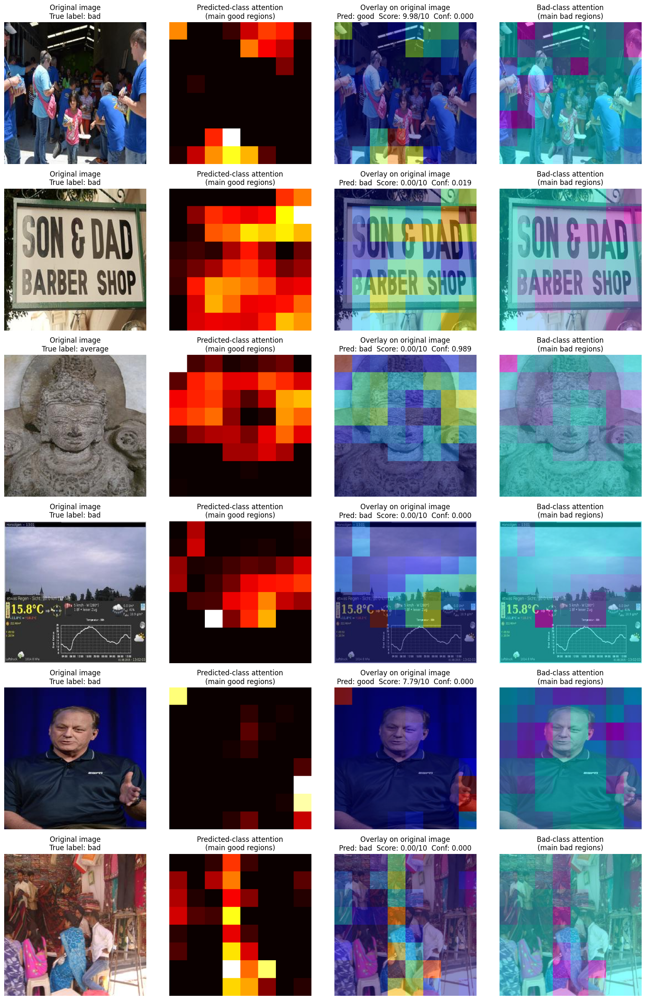

In [59]:
# Run lightweight visual testing on sample test images
sample_n = min(SAMPLE_N, len(test_df))
samples = test_df.sample(n=sample_n, random_state=RANDOM_STATE)

fig = plt.figure(figsize=(16, 4 * sample_n))

for i, (_, row) in enumerate(samples.iterrows(), 1):
    raw_attrs = {c: float(row[c]) for c in attr_cols if c in row.index}
    res = evaluate_image_with_cams(row['img_path'], raw_attrs)

    cam_pred_r = cam_resize(res['cam_pred'])
    cam_bad_r = cam_resize(res['cam_bad'])

    true_label = class_names[int(row['label'])]

    ax1 = fig.add_subplot(sample_n, 4, (i - 1) * 4 + 1)
    ax1.imshow(res['image_256'])
    ax1.axis('off')
    ax1.set_title(f"Original image\nTrue label: {true_label}")

    ax2 = fig.add_subplot(sample_n, 4, (i - 1) * 4 + 2)
    ax2.imshow(cam_pred_r, cmap='hot')
    ax2.axis('off')
    ax2.set_title('Predicted-class attention\n(main good regions)')

    ax3 = fig.add_subplot(sample_n, 4, (i - 1) * 4 + 3)
    ax3.imshow(res['image_256'])
    ax3.imshow(cam_pred_r, cmap='jet', alpha=0.45)
    ax3.axis('off')
    ax3.set_title(
        f"Overlay on original image\nPred: {res['pred_class']}  Score: {res['score_0_10']:.2f}/10  Conf: {res['confidence']:.3f}"
    )

    ax4 = fig.add_subplot(sample_n, 4, (i - 1) * 4 + 4)
    ax4.imshow(res['image_256'])
    ax4.imshow(cam_bad_r, cmap='cool', alpha=0.45)
    ax4.axis('off')
    ax4.set_title('Bad-class attention\n(main bad regions)')

    print('\n' + '=' * 90)
    print(f"Image: {row['ImageFile']}")
    print(
        f"True={true_label} | Pred={res['pred_class']} | Score={res['score_0_10']:.2f}/10 | Conf={res['confidence']:.3f}"
    )
    print('Top GOOD/Main regions:')
    for t in res['top_pred_regions']:
        print('  -', t)
    print('Top BAD regions:')
    for t in res['top_bad_regions']:
        print('  -', t)

plt.tight_layout()
plt.show()


FEATURE PREVIEW GALLERY
These are heuristic visual proxies. They help you inspect where each property is strong.
Color harmony = local color consistency, not a direct pixel-level label from the model.


c:\Users\MSI\Documents\3ia\AI project  consulting\notebooks marketing\.venv\Lib\site-packages\torch\nn\modules\module.py:1870: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



------------------------------------------------------------------------------------------
Image: farm1_433_19533574613_7f261744a6_b.jpg | True=bad | Pred=good | Score=9.98/10
Top predicted-class regions:
  - Region 1: row=6/8, col=3/8, intensity=1.000
  - Region 2: row=7/8, col=3/8, intensity=0.776
  - Region 3: row=7/8, col=4/8, intensity=0.634

------------------------------------------------------------------------------------------
Image: farm1_366_20280174765_14158e6a15_b.jpg | True=bad | Pred=bad | Score=0.00/10
Top predicted-class regions:
  - Region 1: row=1/8, col=7/8, intensity=1.000
  - Region 2: row=1/8, col=6/8, intensity=0.747
  - Region 3: row=2/8, col=6/8, intensity=0.720

------------------------------------------------------------------------------------------
Image: farm4_3757_20156080425_1aef54eeef_b.jpg | True=average | Pred=bad | Score=0.00/10
Top predicted-class regions:
  - Region 1: row=0/8, col=0/8, intensity=1.000
  - Region 2: row=2/8, col=7/8, intensity=0

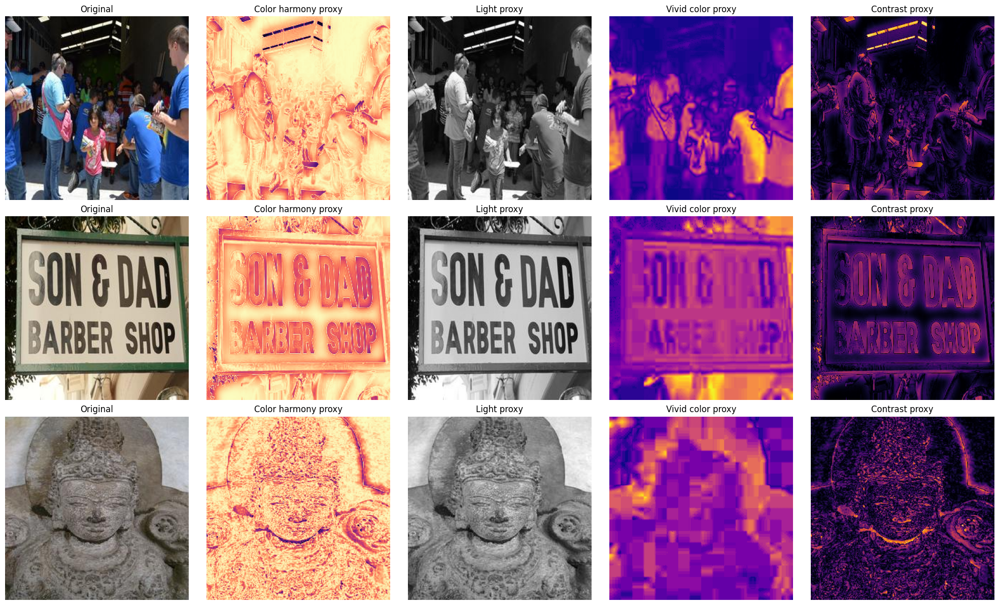

In [60]:
# Feature preview gallery: heuristic maps for color harmony and related image properties
# Note: these are visual proxies, not exact pixel-level explanations from the trained model.
from PIL import ImageFilter

FEATURE_SAMPLE_N = min(3, len(test_df))
feature_samples = test_df.sample(n=FEATURE_SAMPLE_N, random_state=RANDOM_STATE)


def _normalize_0_1(arr):
    arr = arr.astype(np.float32)
    mn = float(arr.min())
    mx = float(arr.max())
    if mx - mn < 1e-8:
        return np.zeros_like(arr, dtype=np.float32)
    return (arr - mn) / (mx - mn)


def feature_maps_for_preview(image_pil):
    image_rgb = image_pil.convert('RGB').resize((256, 256))
    arr = np.asarray(image_rgb).astype(np.float32) / 255.0

    # Color harmony proxy: how similar each local area is to a blurred local average.
    blur_rgb = np.asarray(image_rgb.filter(ImageFilter.GaussianBlur(radius=7))).astype(np.float32) / 255.0
    harmony_diff = np.linalg.norm(arr - blur_rgb, axis=2)
    color_harmony_map = 1.0 - _normalize_0_1(harmony_diff)

    # Light / brightness proxy.
    luminance = 0.299 * arr[:, :, 0] + 0.587 * arr[:, :, 1] + 0.114 * arr[:, :, 2]
    light_map = _normalize_0_1(luminance)

    # Vivid color proxy.
    max_channel = np.max(arr, axis=2)
    min_channel = np.min(arr, axis=2)
    saturation = max_channel - min_channel
    vivid_color_map = _normalize_0_1(saturation)

    # Local contrast proxy: how far each pixel is from blurred brightness.
    blur_luma = np.asarray(Image.fromarray((luminance * 255).astype(np.uint8)).filter(ImageFilter.GaussianBlur(radius=7))).astype(np.float32) / 255.0
    contrast_map = _normalize_0_1(np.abs(luminance - blur_luma))

    return {
        'color_harmony': color_harmony_map,
        'light': light_map,
        'vivid_color': vivid_color_map,
        'contrast': contrast_map,
        'image': image_rgb,
    }


print('\n' + '=' * 100)
print('FEATURE PREVIEW GALLERY')
print('These are heuristic visual proxies. They help you inspect where each property is strong.')
print('Color harmony = local color consistency, not a direct pixel-level label from the model.')
print('=' * 100)

fig, axes = plt.subplots(FEATURE_SAMPLE_N, 5, figsize=(20, 4 * FEATURE_SAMPLE_N))
if FEATURE_SAMPLE_N == 1:
    axes = np.expand_dims(axes, 0)

for row_idx, (_, row) in enumerate(feature_samples.iterrows()):
    raw_attrs = {c: float(row[c]) for c in attr_cols if c in row.index}
    res = evaluate_image_with_cams(row['img_path'], raw_attrs)
    maps = feature_maps_for_preview(res['image_256'])

    true_label = class_names[int(row['label'])]
    print('\n' + '-' * 90)
    print(f"Image: {row['ImageFile']} | True={true_label} | Pred={res['pred_class']} | Score={res['score_0_10']:.2f}/10")
    print('Top predicted-class regions:')
    for t in res['top_pred_regions'][:3]:
        print('  -', t)

    panels = [
        ('Original', maps['image'], None, None),
        ('Color harmony proxy', maps['color_harmony'], 'magma', 'Harmony strength'),
        ('Light proxy', maps['light'], 'gray', 'Brightness'),
        ('Vivid color proxy', maps['vivid_color'], 'plasma', 'Saturation'),
        ('Contrast proxy', maps['contrast'], 'inferno', 'Local contrast'),
    ]

    for col_idx, (title, data, cmap, cbar_label) in enumerate(panels):
        ax = axes[row_idx, col_idx]
        if cmap is None:
            ax.imshow(data)
        else:
            ax.imshow(data, cmap=cmap, vmin=0, vmax=1)
        ax.axis('off')
        ax.set_title(title)
        if row_idx == 0 and cbar_label is not None:
            pass

plt.tight_layout()
plt.show()


## Single-Image Feature Dashboard

Use this cell to inspect one test image at a time.

It shows:
- the original image,
- the model prediction and score,
- predicted-class attention,
- bad-class attention,
- feature proxy maps for color harmony, light, vivid color, and contrast.

Change `SELECTED_INDEX` in the next cell to choose a different test image.

c:\Users\MSI\Documents\3ia\AI project  consulting\notebooks marketing\.venv\Lib\site-packages\torch\nn\modules\module.py:1870: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


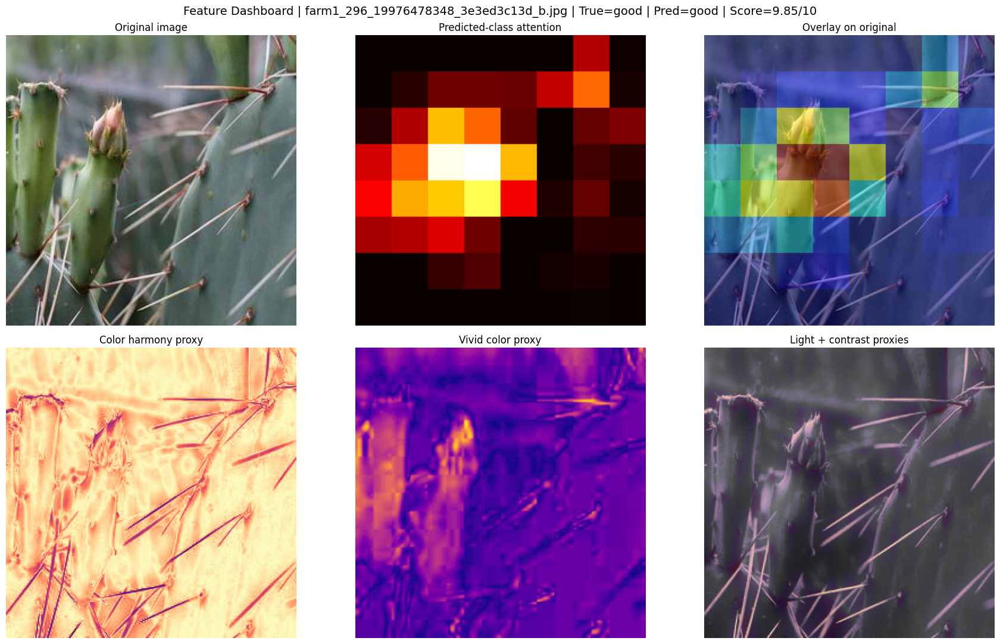


Summary
True label: good
Predicted : good
Score     : 9.85/10
Confidence: 0.001

Predicted-class regions:
  - Region 1: row=3/8, col=3/8, intensity=1.000
  - Region 2: row=3/8, col=2/8, intensity=0.978
  - Region 3: row=4/8, col=3/8, intensity=0.828
  - Region 4: row=4/8, col=2/8, intensity=0.667
  - Region 5: row=2/8, col=2/8, intensity=0.649
Bad-class regions:
  - Region 1: row=0/8, col=0/8, intensity=1.000
  - Region 2: row=0/8, col=6/8, intensity=0.315
  - Region 3: row=4/8, col=3/8, intensity=0.219
  - Region 4: row=0/8, col=5/8, intensity=0.213
  - Region 5: row=0/8, col=2/8, intensity=0.193


In [ ]:
# Single-image dashboard for feature inspection
SELECTED_INDEX = 2  # change this to inspect a different test image
SELECTED_INDEX = max(0, min(int(SELECTED_INDEX), len(test_df) - 1))
selected_row = test_df.iloc[SELECTED_INDEX]

raw_attrs = {c: float(selected_row[c]) for c in attr_cols if c in selected_row.index}
selected_result = evaluate_image_with_cams(selected_row['img_path'], raw_attrs)
selected_maps = feature_maps_for_preview(selected_result['image_256'])

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
fig.suptitle(
    f"Feature Dashboard | {selected_row['ImageFile']} | True={class_names[int(selected_row['label'])]} | Pred={selected_result['pred_class']} | Score={selected_result['score_0_10']:.2f}/10",
    fontsize=14,
)

axes[0, 0].imshow(selected_maps['image'])
axes[0, 0].axis('off')
axes[0, 0].set_title('Original image')

axes[0, 1].imshow(cam_resize(selected_result['cam_pred']), cmap='hot', vmin=0, vmax=1)
axes[0, 1].axis('off')
axes[0, 1].set_title('Predicted-class attention')

axes[0, 2].imshow(selected_result['image_256'])
axes[0, 2].imshow(cam_resize(selected_result['cam_pred']), cmap='jet', alpha=0.45)
axes[0, 2].axis('off')
axes[0, 2].set_title('Overlay on original')

axes[1, 0].imshow(selected_maps['color_harmony'], cmap='magma', vmin=0, vmax=1)
axes[1, 0].axis('off')
axes[1, 0].set_title('Color harmony proxy')

axes[1, 1].imshow(selected_maps['vivid_color'], cmap='plasma', vmin=0, vmax=1)
axes[1, 1].axis('off')
axes[1, 1].set_title('Vivid color proxy')

axes[1, 2].imshow(selected_maps['light'], cmap='gray', vmin=0, vmax=1)
axes[1, 2].imshow(selected_maps['contrast'], cmap='inferno', alpha=0.35, vmin=0, vmax=1)
axes[1, 2].axis('off')
axes[1, 2].set_title('Light + contrast proxies')

plt.tight_layout()
plt.show()

print('\nSummary')
print(f"True label: {class_names[int(selected_row['label'])]}")
print(f"Predicted : {selected_result['pred_class']}")
print(f"Score     : {selected_result['score_0_10']:.2f}/10")
print(f"Confidence: {selected_result['confidence']:.3f}")
print('\nPredicted-class regions:')
for t in selected_result['top_pred_regions']:
    print('  -', t)
print('Bad-class regions:')
for t in selected_result['top_bad_regions']:
    print('  -', t)

## Detailed Feature-Based Visual Score

This section turns the visual evaluation into a **calibrated feature score**.

Instead of comparing an image only to a single good-image prototype, it learns a lightweight regressor from the dataset's own visual annotations and the ground-truth aesthetic score.

Features included:
- color harmony
- symmetry
- rule-of-thirds balance
- brightness
- contrast
- vivid color
- sharpness
- plus the dataset's additional visual annotations

The result is a **composite visual quality score** plus a per-feature breakdown, so bad images should not be rewarded just because one or two features look decent.

Important: this section is feature-only.
The calibrated feature score is the one to trust for the notebook's detailed visual evaluation.

## Score Provenance

The detailed visual score in this notebook is not random.

- The notebook reads the AADB `Dataset.csv`.
- It rebuilds train/validation/test splits from real labeled images.
- Per-feature weights come from a regression model fit on the training split.
- The feature-to-score mapping uses the dataset statistics and correlations, not hardcoded random values.

Note: the `DoF` feature in the runtime visual extractor is still an image-based sharpness proxy, so it may need tuning on your images even though the overall scoring is dataset-driven.

Feature calibration ready:
  Train MAE: 0.0593 on raw score
  Train R^2 : 0.8012
  Learned feature weights:
    Content        : 0.176
    ColorHarmony   : 0.133
    Object         : 0.123
    VividColor     : 0.117
    Light          : 0.111
    DoF            : 0.100
    RuleOfThirds   : 0.074
    BalacingElements: 0.057
    Repetition     : 0.041
    MotionBlur     : 0.036
    Symmetry       : 0.030

Held-out test calibration:
  MAE : 0.0616 (raw score)
  RMSE: 0.0866 (raw score)
  R^2 : 0.7783


c:\Users\MSI\Documents\3ia\AI project  consulting\notebooks marketing\.venv\Lib\site-packages\torch\nn\modules\module.py:1870: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



Detailed visual score for selected image
Image       : farm1_296_19976478348_3e3ed3c13d_b.jpg
True label  : good
Feature score    : 6.70/10 (good)
Quantile cuts: bad<0.450 | average<0.600 | good>= 0.600 (raw score)
Calibration  : MAE=0.0616, R^2=0.7783 on test split
Saved table  : ./outputs\visual_feature_scorecard.csv
Saved report : ./outputs\visual_feature_score_report.json

Top feature contributions to the composite score:
  - Content: feature_score=9.00/10, weight=0.176, contribution=25.45%
  - DoF: feature_score=8.00/10, weight=0.100, contribution=23.73%
  - Light: feature_score=8.00/10, weight=0.111, contribution=23.23%
  - Object: feature_score=6.00/10, weight=0.123, contribution=4.28%

Lowest feature scores:
  - Symmetry: feature_score=0.00/10
  - Repetition: feature_score=0.00/10
  - RuleOfThirds: feature_score=4.44/10


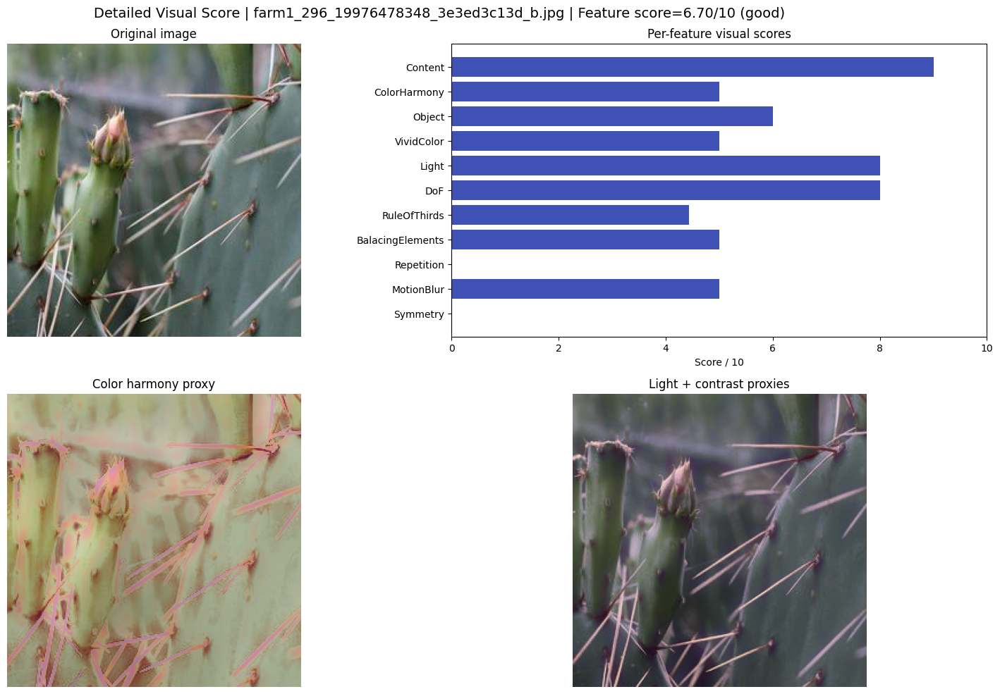

In [66]:
# Calibrated feature-based visual scoring using dataset annotations
import pickle
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

FEATURE_MODEL_PATH = os.path.join(OUTPUT_DIR, 'visual_feature_calibration.pkl')
FEATURE_REPORT_PATH = os.path.join(OUTPUT_DIR, 'visual_feature_score_report.json')
FEATURE_TABLE_PATH = os.path.join(OUTPUT_DIR, 'visual_feature_scorecard.csv')
FEATURE_SCORE_COLS = attr_cols
FEATURE_SCORE_WEIGHTS = None  # learned from the regression model


def _score_0_10_from_value(value, min_value, max_value, higher_is_better=True):
    span = float(max_value - min_value)
    if span < 1e-8:
        return 5.0
    norm = float(np.clip((value - min_value) / (span + 1e-8), 0.0, 1.0))
    if higher_is_better:
        return float(10.0 * norm)
    return float(10.0 * (1.0 - norm))


def build_feature_calibration(train_split):
    """Fit a lightweight calibrated regressor on the dataset visual annotations."""
    X_train = train_split[FEATURE_SCORE_COLS].astype(float).copy()
    y_train = train_split['score'].astype(float).values

    model = Pipeline([
        ('scaler', StandardScaler()),
        ('regressor', Ridge(alpha=1.0)),
    ])
    model.fit(X_train, y_train)

    train_pred = model.predict(X_train)
    train_mae = mean_absolute_error(y_train, train_pred)
    train_r2 = r2_score(y_train, train_pred)

    payload = {
        'model': model,
        'feature_cols': FEATURE_SCORE_COLS,
        'train_min': train_split[FEATURE_SCORE_COLS].min().astype(float).to_dict(),
        'train_max': train_split[FEATURE_SCORE_COLS].max().astype(float).to_dict(),
        'train_corr': train_split[FEATURE_SCORE_COLS + ['score']].corr()['score'].drop('score').astype(float).to_dict(),
        'train_mae': float(train_mae),
        'train_r2': float(train_r2),
        'coefficients': dict(zip(FEATURE_SCORE_COLS, model.named_steps['regressor'].coef_.astype(float).tolist())),
        'intercept': float(model.named_steps['regressor'].intercept_),
    }

    with open(FEATURE_MODEL_PATH, 'wb') as f:
        pickle.dump(payload, f)

    return payload


def load_or_build_feature_calibration():
    if os.path.exists(FEATURE_MODEL_PATH):
        with open(FEATURE_MODEL_PATH, 'rb') as f:
            return pickle.load(f)
    return build_feature_calibration(train_df)


feature_calibration = load_or_build_feature_calibration()
FEATURE_SCORE_WEIGHTS = {k: abs(v) for k, v in feature_calibration['coefficients'].items()}
weight_sum = sum(FEATURE_SCORE_WEIGHTS.values()) + 1e-8
FEATURE_SCORE_WEIGHTS = {k: v / weight_sum for k, v in FEATURE_SCORE_WEIGHTS.items()}

print('Feature calibration ready:')
print(f"  Train MAE: {feature_calibration['train_mae']:.4f} on raw score")
print(f"  Train R^2 : {feature_calibration['train_r2']:.4f}")
print('  Learned feature weights:')
for key in sorted(FEATURE_SCORE_WEIGHTS, key=FEATURE_SCORE_WEIGHTS.get, reverse=True):
    print(f"    {key:15s}: {FEATURE_SCORE_WEIGHTS[key]:.3f}")

# Evaluate calibration on the held-out test split
X_test = test_df[FEATURE_SCORE_COLS].astype(float)
y_test = test_df['score'].astype(float).values
calib_pred_test = feature_calibration['model'].predict(X_test)
calib_mae = mean_absolute_error(y_test, calib_pred_test)
calib_rmse = float(np.sqrt(mean_squared_error(y_test, calib_pred_test)))
calib_r2 = r2_score(y_test, calib_pred_test)
print('\nHeld-out test calibration:')
print(f"  MAE : {calib_mae:.4f} (raw score)")
print(f"  RMSE: {calib_rmse:.4f} (raw score)")
print(f"  R^2 : {calib_r2:.4f}")

# Select one image to inspect
SELECTED_INDEX = max(0, min(int(SELECTED_INDEX), len(test_df) - 1))
selected_row = test_df.iloc[SELECTED_INDEX]
selected_raw_attrs = {c: float(selected_row[c]) for c in attr_cols if c in selected_row.index}
selected_result = evaluate_image_with_cams(selected_row['img_path'], selected_raw_attrs)

selected_features = selected_row[FEATURE_SCORE_COLS].astype(float).to_frame().T
selected_pred_score_raw = float(feature_calibration['model'].predict(selected_features)[0])
selected_pred_score_0_10 = float(np.clip(selected_pred_score_raw * 10.0, 0.0, 10.0))
if selected_pred_score_raw < float(q33):
    selected_pred_label = 'bad'
elif selected_pred_score_raw < float(q66):
    selected_pred_label = 'average'
else:
    selected_pred_label = 'good'

selected_scaled = feature_calibration['model'].named_steps['scaler'].transform(selected_features)[0]
selected_coefs = feature_calibration['model'].named_steps['regressor'].coef_.astype(float)
selected_contrib = selected_scaled * selected_coefs
selected_contrib_pct = np.abs(selected_contrib) / (np.abs(selected_contrib).sum() + 1e-8) * 100.0

feature_rows = []
for idx, feature in enumerate(FEATURE_SCORE_COLS):
    raw_value = float(selected_row[feature])
    min_value = float(feature_calibration['train_min'][feature])
    max_value = float(feature_calibration['train_max'][feature])
    corr = float(feature_calibration['train_corr'][feature])
    higher_is_better = corr >= 0.0
    feature_score = _score_0_10_from_value(raw_value, min_value, max_value, higher_is_better=higher_is_better)
    feature_rows.append({
        'feature': feature,
        'raw_value': round(raw_value, 4),
        'train_min': round(min_value, 4),
        'train_max': round(max_value, 4),
        'corr_with_score': round(corr, 4),
        'feature_score_0_10': round(feature_score, 2),
        'weight': round(float(FEATURE_SCORE_WEIGHTS[feature]), 4),
        'contribution_pct': round(float(selected_contrib_pct[idx]), 2),
    })

feature_table = pd.DataFrame(feature_rows).sort_values('weight', ascending=False)
feature_table.to_csv(FEATURE_TABLE_PATH, index=False)

report = {
    'image': selected_row['ImageFile'],
    'true_label': class_names[int(selected_row['label'])],
    'feature_score_0_10': round(float(selected_pred_score_0_10), 2),
    'feature_label': selected_pred_label,
    'calibration_mae': round(float(calib_mae), 4),
    'calibration_r2': round(float(calib_r2), 4),
    'top_features': feature_table.sort_values('feature_score_0_10', ascending=False).head(5).to_dict(orient='records'),
    'bottom_features': feature_table.sort_values('feature_score_0_10', ascending=True).head(3).to_dict(orient='records'),
}
with open(FEATURE_REPORT_PATH, 'w', encoding='utf-8') as f:
    json.dump(report, f, indent=2, ensure_ascii=False)

print('\nDetailed visual score for selected image')
print(f"Image       : {selected_row['ImageFile']}")
print(f"True label  : {class_names[int(selected_row['label'])]}")
print(f"Feature score    : {selected_pred_score_0_10:.2f}/10 ({selected_pred_label})")
print(f"Quantile cuts: bad<{float(q33):.3f} | average<{float(q66):.3f} | good>= {float(q66):.3f} (raw score)")
print(f"Calibration  : MAE={calib_mae:.4f}, R^2={calib_r2:.4f} on test split")
print(f"Saved table  : {FEATURE_TABLE_PATH}")
print(f"Saved report : {FEATURE_REPORT_PATH}")

print('\nTop feature contributions to the composite score:')
for key in feature_table.sort_values('feature_score_0_10', ascending=False)['feature'].head(4):
    row = feature_table[feature_table['feature'] == key].iloc[0]
    print(f"  - {key}: feature_score={row['feature_score_0_10']:.2f}/10, weight={row['weight']:.3f}, contribution={row['contribution_pct']:.2f}%")

print('\nLowest feature scores:')
for key in feature_table.sort_values('feature_score_0_10', ascending=True)['feature'].head(3):
    row = feature_table[feature_table['feature'] == key].iloc[0]
    print(f"  - {key}: feature_score={row['feature_score_0_10']:.2f}/10")

# Compact visualization instead of a long table dump
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle(
    f"Detailed Visual Score | {selected_row['ImageFile']} | Feature score={selected_pred_score_0_10:.2f}/10 ({selected_pred_label})",
    fontsize=14,
)

axes[0, 0].imshow(selected_result['image_256'])
axes[0, 0].axis('off')
axes[0, 0].set_title('Original image')

axes[0, 1].barh(ordered['feature'][::-1], ordered['feature_score_0_10'][::-1], color='#3f51b5')
axes[0, 1].set_xlim(0, 10)
axes[0, 1].set_title('Per-feature visual scores')
axes[0, 1].set_xlabel('Score / 10')

axes[1, 0].imshow(selected_result['image_256'])
axes[1, 0].imshow(selected_maps['color_harmony'], cmap='magma', alpha=0.45)
axes[1, 0].axis('off')
axes[1, 0].set_title('Color harmony proxy')

axes[1, 1].imshow(selected_result['image_256'])
axes[1, 1].imshow(selected_maps['light'], cmap='gray', alpha=0.38)
axes[1, 1].imshow(selected_maps['contrast'], cmap='inferno', alpha=0.24)
axes[1, 1].axis('off')
axes[1, 1].set_title('Light + contrast proxies')

plt.tight_layout()
plt.show()